<a href="https://colab.research.google.com/github/gurunzpritam/AIT_INTERNSHIP/blob/main/frcnn1200final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

step 1 : Mount your google drive


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


step 2 : change your working directory

In [ ]:
%cd '/content/gdrive/MyDrive/FRCNN'

/content/gdrive/MyDrive/FRCNN


step 3: install the required dependencies of the detectron2

In [ ]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities.
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
fatal: destination path 'detectron2' already exists and is not an empty directory.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import torch , torchvision
torch.__version__

'2.0.0+cu118'

In [ ]:
# Setup detectron2 logger
import detectron2
# from detecton2 import utils
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
from detectron2.data.datasets import register_coco_instances


In [ ]:
# load the train dataset using coco instances
register_coco_instances('train', {}, '/content/gdrive/MyDrive/FRCNN/data/train/Task1_train.json', '/content/gdrive/MyDrive/FRCNN/data/train/images')

In [ ]:
train_metadata = MetadataCatalog.get('train')
train_data_dictionary = DatasetCatalog.get('train')

In [ ]:
# train_data
import random
import cv2
from google.colab.patches import cv2_imshow

step 5: Visualize the images using Visualizer

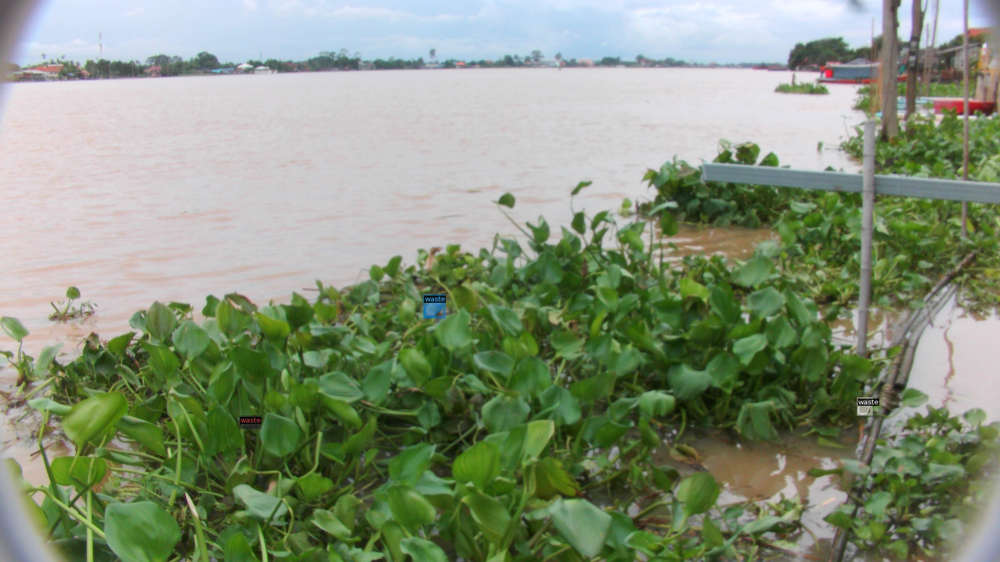

In [ ]:
for i in random.sample(train_data_dictionary, 1):
  img = cv2.imread(i["file_name"])
  visualizer = Visualizer(img[:,:, ::-1], metadata= train_metadata, scale = 0.5)
  vis = visualizer.draw_dataset_dict(i)
  cv2_imshow(vis.get_image()[:,:,::-1])

step 6: Setup the model

In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
config_name = "COCO-Detection/faster_rcnn_R_50_FPN_1x.yaml"
cfg.merge_from_file(model_zoo.get_config_file(config_name))
cfg.DATASETS.TRAIN = ("train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_1x.yaml") 
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0025
cfg.SOLVER.MAX_ITER = 1200
cfg.SOLVER.STEPS = []        
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)

[05/11 12:08:10 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_b275ba.pkl: 167MB [00:01, 147MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


In [ ]:
trainer.train()

[05/11 12:08:12 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[05/11 12:08:45 d2.utils.events]:  eta: 0:23:02  iter: 19  total_loss: 1.156  loss_cls: 0.7326  loss_box_reg: 0.2112  loss_rpn_cls: 0.2158  loss_rpn_loc: 0.03787    time: 1.1767  last_time: 1.1786  data_time: 0.7387  last_data_time: 0.7257   lr: 4.9952e-05  max_mem: 2546M
[05/11 12:09:15 d2.utils.events]:  eta: 0:22:30  iter: 39  total_loss: 0.7732  loss_cls: 0.3146  loss_box_reg: 0.1804  loss_rpn_cls: 0.177  loss_rpn_loc: 0.05779    time: 1.2120  last_time: 1.2807  data_time: 0.6712  last_data_time: 0.8171   lr: 9.9902e-05  max_mem: 2546M
[05/11 12:09:41 d2.utils.events]:  eta: 0:22:09  iter: 59  total_loss: 0.5551  loss_cls: 0.1574  loss_box_reg: 0.1674  loss_rpn_cls: 0.0831  loss_rpn_loc: 0.03343    time: 1.2268  last_time: 1.1690  data_time: 0.8130  last_data_time: 0.7045   lr: 0.00014985  max_mem: 2547M
[05/11 12:10:07 d2.utils.events]:  eta: 0:22:02  iter: 79  total_loss: 0.6701  loss_cls: 0.2367  loss_box_reg: 0.2575  loss_rpn_cls: 0.07565  loss_rpn_loc: 0.07098    time: 1.2497 

step 7: create a predictor

In [ ]:
import os
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth") 
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
predictor = DefaultPredictor(cfg)


step 8 : visulaize the inferneces

[05/11 12:31:52 d2.data.datasets.coco]: Loaded 1149 images in COCO format from /content/gdrive/MyDrive/FRCNN/data/train/Task1_train.json


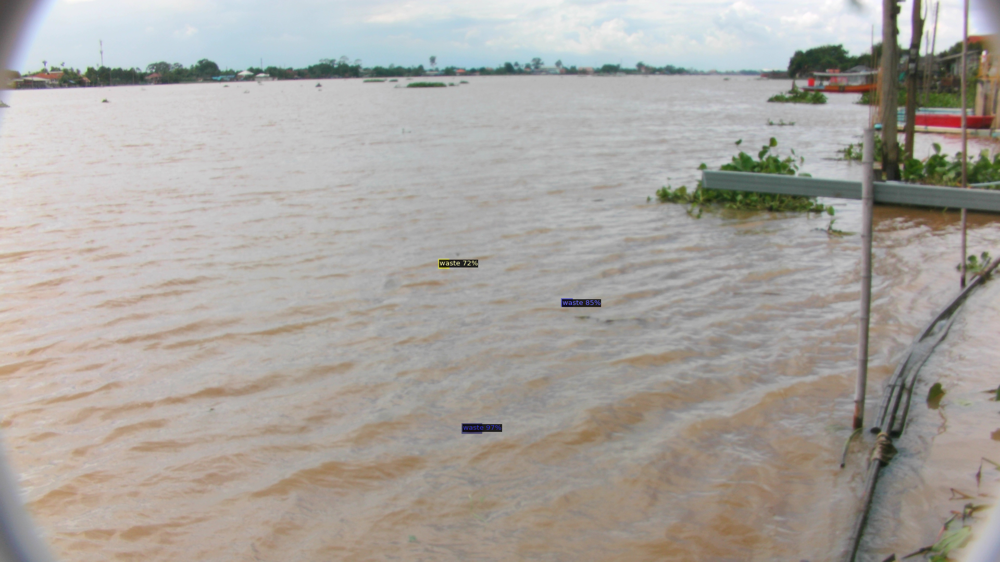

In [ ]:
from detectron2.utils.visualizer import ColorMode

dataset_dicts = DatasetCatalog.get("train")
for d in random.sample(dataset_dicts, 1):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  
    v = Visualizer(im[:, :, ::-1],
                   metadata=train_metadata, 
                   scale=0.5, 
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])
     

In [ ]:
# import json

# # Replace "/path/to/annotations.json" with the path to your annotation file in Drive
# with open('/content/gdrive/MyDrive/FRCNN/data/val/Task1_val.json', 'r') as f:
#     annotations = json.load(f)

# for ann in annotations['annotations']:
#     ann['iscrowd'] = 0 # Replace 0 with the appropriate value for your annotations

# with open('/content/gdrive/MyDrive/FRCNN/data/val/Task1_val.json', 'w') as f:
#     json.dump(annotations, f)



step 9: do the evaluation using coocEvalutaor

In [ ]:
# load the val dataset using coco instances
# register_coco_instances('val', {}, '/content/gdrive/MyDrive/FRCNN/data/val/Task1_val.json', '/content/gdrive/MyDrive/FRCNN/data/val/images')

from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("val")
# evaluator = COCOEvaluator("val", iscrowd=None)
val_loader = build_detection_test_loader(cfg, "val")
print(inference_on_dataset(trainer.model, val_loader, evaluator))

[05/11 12:33:10 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
[05/11 12:33:10 d2.data.datasets.coco]: Loaded 276 images in COCO format from /content/gdrive/MyDrive/FRCNN/data/val/Task1_val.json
[05/11 12:33:10 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/11 12:33:10 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[05/11 12:33:10 d2.data.common]: Serializing 276 elements to byte tensors and concatenating them all ...
[05/11 12:33:10 d2.data.common]: Serialized dataset takes 0.27 MiB
[05/11 12:33:10 d2.evaluation.evaluator]: Start inference on 276 batches
[05/11 12:33:16 d2.evaluation.evaluator]: Inference done 11/276. Dataloading: 0.2086 s/iter. Inference: 0.1165 s/iter. Eval: 0.0004 s/iter. Total: 0.3256 s/iter. ETA=0:01:26
[05/11 12:33:21 d2.evaluation.evaluator

In [ ]:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>